# Predicting Earthquakes Part 1

This study is ispired by the work published here [Earthquake Prediction Using Python: A Geospatial Data Analysis Guide](https://medium.com/@malinian/earthquake-prediction-using-python-a-geospatial-data-analysis-guide-1ef1bc171a86]) and designed with the help of 

In [4]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import datetime
from sklearn.model_selection import GridSearchCV
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

## Data Source
Data is sourced from the usgs and covers the seismic events over the previous 30 days starting with the date of analysis. For simplicity, only time, magnification, depth, and location data are retained.

In [6]:
from datetime import datetime

def scrape_earthquake_data():
    url = 'https://earthquake.usgs.gov/earthquakes/feed/v1.0/summary/all_month.csv'
    response = requests.get(url)
    if response.status_code == 200:
        data = pd.read_csv(url)
        return data
    else:
        print(f"Failed to retrieve data. Status code: {response.status_code}")
        return None

# Scrape earthquake data
usgsData = pd.DataFrame(scrape_earthquake_data())

# Display the first few rows of the dataset
if usgsData is not None:
    earthquake_data = pd.DataFrame({'time': [datetime.strptime(d, "%Y-%m-%dT%H:%M:%S.%fZ") for d in usgsData.time],
                                    'mag' : usgsData.mag,
                                    'depth' : usgsData.depth,
                                    'latitude' : usgsData.latitude,
                                    'longitude' : usgsData.longitude,
                                    'place' : usgsData.place})
else:
    earthquake_data = "No earthquake data retrieved."

earthquake_data

,time,mag,depth,latitude,longitude,place
0,2024-09-21 04:54:05.610,1.29,1.85,38.794498,-122.727837,"3 km SSW of Cobb, CA"
1,2024-09-21 04:50:44.160,2.98,0.10,40.566833,-124.987335,"61 km W of Ferndale, CA"
2,2024-09-21 04:46:10.250,0.85,1.59,38.839001,-122.798668,"7 km WNW of Cobb, CA"
3,2024-09-21 04:41:04.760,0.74,2.79,38.810833,-122.821503,"7 km NW of The Geysers, CA"
4,2024-09-21 04:14:21.260,0.98,4.71,35.949167,-117.687833,"20 km E of Little Lake, CA"
...,...,...,...,...,...,...
9582,2024-08-22 05:17:50.810,2.07,1.31,19.390500,-155.249333,"6 km SSW of Volcano, Hawaii"
9583,2024-08-22 05:16:40.780,1.49,1.22,19.389333,-155.249833,"6 km SSW of Volcano, Hawaii"
9584,2024-08-22 05:12:20.480,0.82,3.92,37.546000,-118.824833,"13 km W of Toms Place, CA"
9585,2024-08-22 05:09:47.370,1.23,7.07,35.622833,-117.477000,"17 km SSW of Searles Valley, CA"


### The figure show the distribution of the seismic events by magnitude over the past 30 days. 
We are particularly interested in predicting earthquakes with a magnitude of at least 5.

C:\Users\Lenovo\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


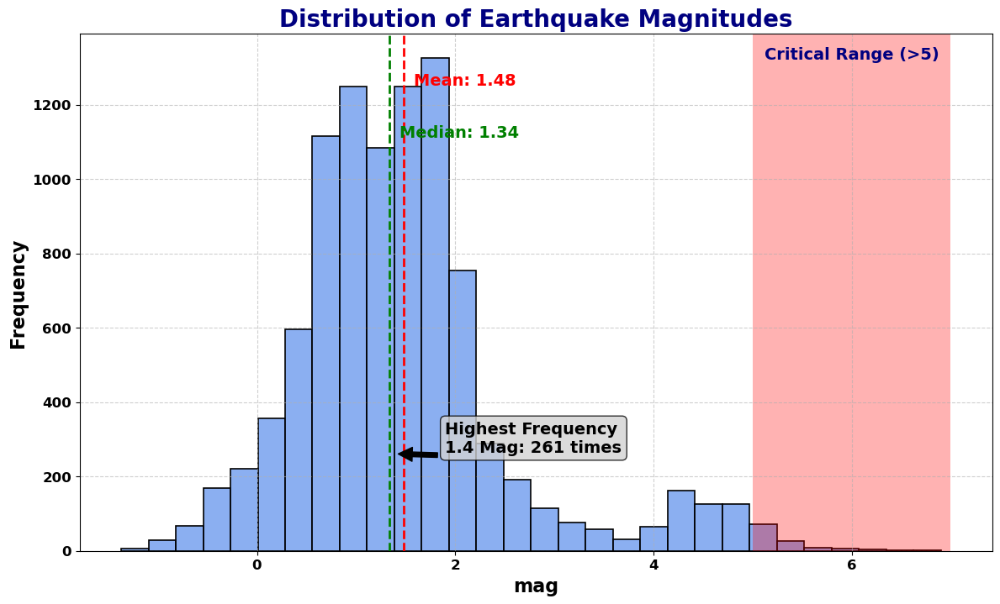

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_magnitude_distribution(df):
    plt.figure(figsize=(14, 8))
    
    # Create the histogram with KDE plot using blue hues
    sns.histplot(df['mag'], bins=30, color='cornflowerblue', edgecolor='black', linewidth=1.2)
    
    # Add a vertical line at the mean magnitude
    mean_magnitude = df['mag'].mean()
    plt.axvline(mean_magnitude, color='red', linestyle='--', linewidth=2)
    plt.text(mean_magnitude + 0.1, plt.ylim()[1] * 0.9, f'Mean: {mean_magnitude:.2f}', color='red', fontsize=14, fontweight='bold')
    
    # Add a vertical line at the median magnitude
    median_magnitude = df['mag'].median()
    plt.axvline(median_magnitude, color='green', linestyle='--', linewidth=2)
    plt.text(median_magnitude + 0.1, plt.ylim()[1] * 0.8, f'Median: {median_magnitude:.2f}', color='green', fontsize=14, fontweight='bold')
    
    # Customizing the title and labels
    plt.title('Distribution of Earthquake Magnitudes', fontsize=20, fontweight='bold', color='navy')
    plt.xlabel('mag', fontsize=16, fontweight='bold')
    plt.ylabel('Frequency', fontsize=16, fontweight='bold')
    
    # Customize the tick parameters
    plt.xticks(fontsize=12, fontweight='bold')
    plt.yticks(fontsize=12, fontweight='bold')
        
    # Add custom grid
    plt.grid(True, linestyle='--', alpha=0.6)
    
    # Highlight certain ranges with a shaded area
    plt.axvspan(5, np.ceil(df['mag'].max()), color='red', alpha=0.3, lw=0)
    plt.text(6, plt.ylim()[1] * 0.95, 'Critical Range (>5)', color='navy', fontsize=14, fontweight='bold', ha='center')
    
    # Adding annotations for the highest frequency bin
    max_freq_bin = df['mag'].value_counts().idxmax()
    max_freq_count = df['mag'].value_counts().max()
    plt.annotate(f'Highest Frequency\n{max_freq_bin} Mag: {max_freq_count} times',
                 xy=(max_freq_bin, df['mag'].value_counts()[max_freq_bin]),
                 xytext=(max_freq_bin + 0.5, df['mag'].value_counts()[max_freq_bin] + 5),
                 arrowprops=dict(facecolor='black', shrink=0.05),
                 fontsize=14, fontweight='bold',
                 bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgray", alpha=0.8))
    
    # Show the plot
    plt.show()

# Plot the enhanced magnitude distribution with blue hues
plot_magnitude_distribution(earthquake_data)

### The Data Below shows the location of the Events over the past 30 days

In [10]:
import folium
from folium.plugins import MarkerCluster

def plot_enhanced_geo_map(df):
    # Initialize the map centered around the mean coordinates
    m = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()], zoom_start=2)

    # Create a marker cluster
    marker_cluster = MarkerCluster().add_to(m)

    # Add points to the map with color coding and informative popups
    for _, row in df.iterrows():
        magnitude = row['mag']
        if magnitude < 3.0:
            color = 'blue'
        elif 3.0 <= magnitude < 5.0:
            color = 'green'
        elif 5.0 <= magnitude < 7.0:
            color = 'orange'
        else:
            color = 'red'
        
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=5,
            popup=(
                f"Location: {row['place']}<br>"
                f"Time: {row['time']}<br>"
                f"Magnitude: {row['mag']}<br>"
                f"Depth: {row['depth']} km"
            ),
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7
        ).add_to(marker_cluster)

    return m

# Display the enhanced map
enhanced_earthquake_map = plot_enhanced_geo_map(earthquake_data)
#enhanced_earthquake_map.save("enhanced_earthquake_map.html")
enhanced_earthquake_map

### Data Randomization
A second data set is created with same values by randomized by time and location.

In [12]:

randidx = np.random.randint(0, len(earthquake_data), len(earthquake_data))

randomData = pd.DataFrame({
    'time' : np.random.permutation(earthquake_data.time),
    'mag' : np.random.permutation(earthquake_data.mag),
    'depth' : np.random.permutation(earthquake_data.depth),
    'latitude' : [earthquake_data.latitude[i] for i in randidx],
    'longitude' : [earthquake_data.longitude[i] for i in randidx],
    'place' : [earthquake_data.place[i] for i in randidx]
    })

randomData

,time,mag,depth,latitude,longitude,place
0,2024-09-16 21:30:11.550,1.99,1.7600,53.956500,-166.545167,"7 km N of Dutch Harbor, Alaska"
1,2024-09-12 19:26:05.020,1.20,12.2000,36.706100,-116.077600,"39 km WNW of Indian Springs, Nevada"
2,2024-09-03 09:36:31.870,1.30,-0.2400,33.376833,-116.270833,"17 km NE of Borrego Springs, CA"
3,2024-09-11 02:57:02.501,0.27,1.9214,38.841331,-122.811836,"8 km WNW of Cobb, CA"
4,2024-09-08 10:08:32.444,1.31,143.4600,38.818832,-122.811836,"7 km NW of The Geysers, CA"
...,...,...,...,...,...,...
9582,2024-08-28 11:48:48.620,4.80,4.6200,38.834500,-122.789667,"6 km WNW of Cobb, CA"
9583,2024-09-07 10:25:00.210,2.29,22.5500,33.317000,-116.379167,"7 km N of Borrego Springs, CA"
9584,2024-09-01 17:01:40.070,1.71,11.7200,17.822333,-68.067500,"84 km SE of Boca de Yuma, Dominican Republic"
9585,2024-08-25 17:01:28.408,1.76,6.7000,33.182500,-115.615667,"11 km SW of Niland, CA"


### The timeline below displays the timing of the actual events
Blue dots represent recorded seismic events.  Red lines indicate earthquakes with a magnitude greater than 5. 

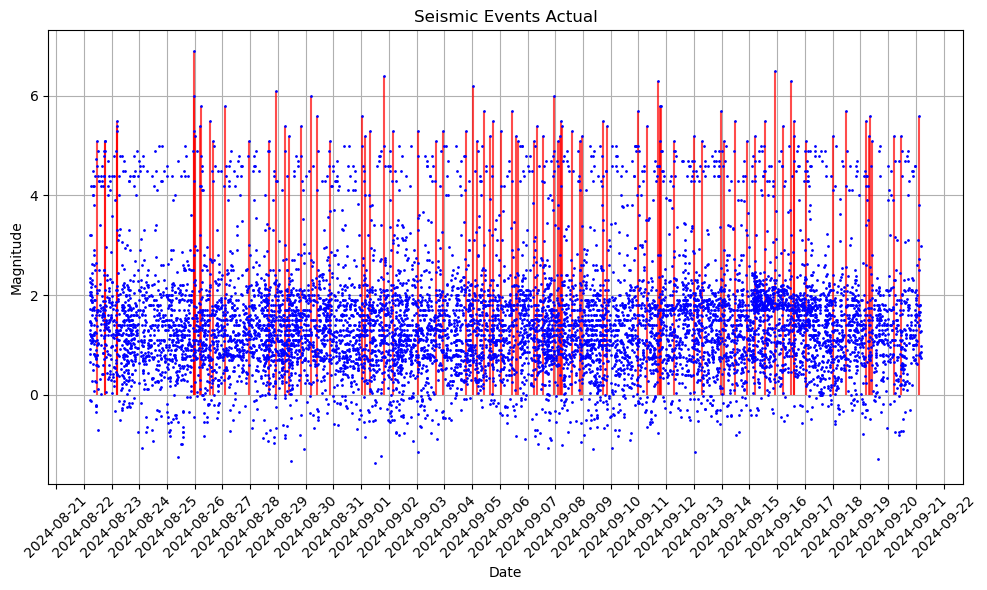

In [14]:
import matplotlib.dates as mdates

# Example earthquake data (dates and magnitudes)


def plotTimeLine(df, plotName):

    majorEvents = df.time[df.mag > 5]
    majorMag = df.mag[df.mag > 5]
    # Create the plot
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Plot vertical lines for each earthquake event
    ax.vlines(majorEvents.values, ymin=0, ymax=majorMag.values, color='red', alpha=0.7)
    
    # Plot earthquake magnitudes as scatter points on the timeline
    ax.scatter(df.time.values, df.mag.values, color='blue', label='Magnitude', zorder=5, s=1)
    
    
    # Formatting the x-axis to show dates properly
    ax.xaxis.set_major_locator(mdates.DayLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    
    # Labeling the axes
    ax.set_xlabel('Date')
    ax.set_ylabel('Magnitude')
    ax.set_title(plotName)
    
    # Rotate the date labels
    plt.xticks(rotation=45)
    
    plt.grid(True)
    plt.tight_layout()
    
    # Show the plot
    plt.show()

plotTimeLine(earthquake_data, 'Seismic Events Actual')

### The timeline below show the timing of the randomized earthquakes

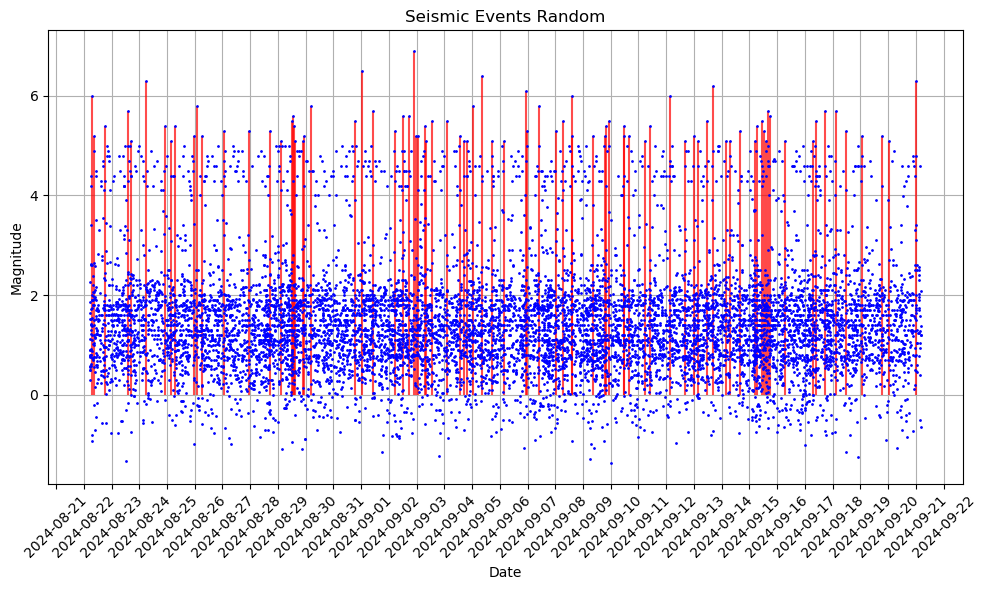

In [16]:
plotTimeLine(randomData, 'Seismic Events Random')

## Study Design

Earthquake predictions will be compared with the randomized data to determine if the forcasting method predicts earthquakes better than chance.  To be considered an accurate prediction, the seismic event must have a >5 magnitude and be identified within 7 days of the initial prediction.  The location of the earthquake must be within 310 miles/500 kilometers of in predicted epicenter.

### Statistics

The accuracy of the prediction model will be determined by chi-squared with p < 0.05 significance threshold.

In [29]:
randomData[randomData.mag > 5].to_csv('random_major.csv')